# Summary Analysis of Netflix

On Netflix, every content has a summary. This analysis compared the keywords in the summaries of the most popular and unpopular movies and shows. It may bring some insights about which keywords should be used to attracted more audiences.

In [ ]:
# load libraries
!pip install wordcloud
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set() 
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import matplotlib.pyplot as plt

%matplotlib inline

## Choose content only available on Netflix
Firstly, “IMDb votes” was chosen as the measurement of popularity. Because it is also related to those in other OTT platforms and cinemas, from three datasets, the index and map function were used to get those only available on Netflix.

In [8]:
# import dataset of movies and shows in netflix with IMDb votes
df_t = pd.read_csv('/Users/s/Desktop/Summary Analysis of Netflix/netflix-rotten-tomatoes-metacritic-imdb.csv')

# import dataset of movies in different OTT platforms
df_m = pd.read_csv('/Users/s/Desktop/Summary Analysis of Netflix/MoviesOnStreamingPlatforms_updated.csv')
df_m_nf = df_m[(df_m['Netflix']==1) & (df_m['Hulu']==0) & (df_m['Prime Video']==0) & (df_m['Disney+']==0)]

# import dataset of series in different OTT platforms
df_s = pd.read_csv('/Users/s/Desktop/Summary Analysis of Netflix/tv_shows.csv')
df_s_nf = df_s[(df_s['Netflix']==1) & (df_s['Hulu']==0) & (df_s['Prime Video']==0) & (df_s['Disney+']==0)]

# get movies and shows with duplicate titles in df_t
count = df_t['Title'].value_counts().to_frame().reset_index()
count.rename(columns={'index':'Title','Title':'Count'},inplace=True)
count_d = count[count['Count']>1]

# delete movies and shows with duplicate titles
df_t_1 = df_t

for n in count_d['Title']:
  indexNames = df_t_1[df_t_1['Title'] == n].index
  df_t_1.drop(indexNames, inplace=True)

#count[count['Count'] == 1].iloc[0]
#count.index[count['Title']=='Alone in Berlin'].tolist()
#count.iloc[366,:]

# test if there're duplicate titles
test = df_t_1['Title'].squeeze()
print(len(pd.Series(test))-pd.Series(test).nunique())

# choose movies and shows only available on Netflix instead of other OTT platforms
df_m_nf_ap = pd.DataFrame()
df_m_nf_ap['Title'] = df_m_nf['Title']

df_s_nf_ap = pd.DataFrame()
df_s_nf_ap['Title'] = df_s_nf['Title']

ap = df_m_nf_ap.append(df_s_nf_ap)

ap['Genre'] = ''
ap['SeriesOrMovie'] = ''
ap['Boxoffice'] = ''
ap['Summary'] = ''
ap['IMDb Votes'] = ''
ap['IMDb Score'] = ''
ap['Tags'] = ''

df_t_1.set_index('Title', inplace=True)

ap['Genre'] = ap.Title.map(df_t_1['Genre'])
ap['SeriesOrMovie'] = ap.Title.map(df_t_1['Series or Movie'])
ap['Boxoffice'] = ap.Title.map(df_t_1['Boxoffice'])
ap['Summary'] = ap.Title.map(df_t_1['Summary'])
ap['IMDb Votes'] = ap.Title.map(df_t_1['IMDb Votes'])
ap['IMDb Score'] = ap.Title.map(df_t_1['IMDb Score'])
ap['Tags'] = ap.Title.map(df_t_1['Tags'])

# choose movies and shows which are not available in cinemas
ap = ap[pd.isnull(ap['Boxoffice'])]
ap.drop(['Boxoffice'], axis=1, inplace=True)

# drop rows with null values
# ap.dropna(subset=['Genre','Summary','IMDb Votes'], inplace=True)
ap.dropna(inplace=True)

0


## Split the dataset into groups by genre
After dropping null values, split the dataset into different groups by Genre. Then from 28 genres, selected those including the most content: thriller, action, romance, drama, comedy and documentary. Based on IMDb votes, chose the top 10% most popular and the bottom 10% least popular content for every genre. 

In [9]:
# seperate multiple genres in one column
ap['Genre'] = ap['Genre'].str.split(",")  
ap_splt = ap.explode('Genre')

# strip leading space in Genre
ap_splt['Genre'] = ap_splt['Genre'].str.strip()

# split dataset into different groups by 'Genre' and count movies and shows in every group
ap_splt.groupby('Genre').size()

Genre
Action          416
Adult             1
Adventure       260
Animation       256
Biography       105
Comedy         1067
Crime           370
Documentary     413
Drama          1304
Family          260
Fantasy         256
Film-Noir         1
Game-Show        15
History          92
Horror          178
Music            80
Musical          43
Mystery         233
News              5
Reality-TV       85
Romance         410
Sci-Fi          188
Short            99
Sport            88
Talk-Show        12
Thriller        500
War              42
Western          14
dtype: int64

In [11]:
# create dataframes of drama, comedy, thriller, action, documentary and romance
drama = ap_splt[ap_splt['Genre']=='Drama']
comedy = ap_splt[ap_splt['Genre']=='Comedy']
thriller = ap_splt[ap_splt['Genre']=='Thriller']
action = ap_splt[ap_splt['Genre']=='Action']
documentary = ap_splt[ap_splt['Genre']=='Documentary']
romance = ap_splt[ap_splt['Genre']=='Romance']

# sort dataframes by popularity(IMDb Votes)
drama = drama.sort_values(by='IMDb Votes', ascending=False)
comedy = comedy.sort_values(by='IMDb Votes', ascending=False)
thriller = thriller.sort_values(by='IMDb Votes', ascending=False)
action = action.sort_values(by='IMDb Votes', ascending=False)
documentary = documentary.sort_values(by='IMDb Votes', ascending=False)
romance = romance.sort_values(by='IMDb Votes', ascending=False)

# choose the top 10% most popular movies and shows
drama_p = drama.iloc[0:int((drama.shape[0])*0.1-1),:]
comedy_p = comedy.iloc[0:int((comedy.shape[0])*0.1-1),:]
thriller_p = thriller.iloc[0:int((thriller.shape[0])*0.1-1),:]
action_p = action.iloc[0:int((action.shape[0])*0.1-1),:]
documentary_p = documentary.iloc[0:int((documentary.shape[0])*0.1-1),:]
romance_p = romance.iloc[0:int((romance.shape[0])*0.1-1),:]

pd.set_option('display.float_format',lambda x: '%.3f' % x)

def dscrb(data):
  print(data['IMDb Votes'].describe())

dscrb(drama_p)
dscrb(comedy_p)
dscrb(documentary_p)
dscrb(thriller_p)
dscrb(action_p)
dscrb(romance_p)

count       129.000
mean     127099.884
std      177323.596
min       30559.000
25%       43947.000
50%       66793.000
75%      124423.000
max     1469976.000
Name: IMDb Votes, dtype: float64
count      105.000
mean     53857.943
std      49732.466
min      17260.000
25%      21208.000
50%      38808.000
75%      62329.000
max     279022.000
Name: IMDb Votes, dtype: float64
count      40.000
mean    20274.350
std     18080.278
min      6783.000
25%      9770.250
50%     15991.500
75%     20898.750
max     86769.000
Name: IMDb Votes, dtype: float64
count        49.000
mean     184792.531
std      252786.639
min       45963.000
25%       70220.000
50%       95755.000
75%      182945.000
max     1469976.000
Name: IMDb Votes, dtype: float64
count       40.000
mean    112201.325
std      80746.803
min      35339.000
25%      52548.000
50%      99674.000
75%     131396.000
max     407581.000
Name: IMDb Votes, dtype: float64
count       40.000
mean     65720.675
std      65321.547
min      1

In [12]:
# choose the bottom 10% of least popular movies and shows
drama_np = drama.iloc[int((drama.shape[0])*0.9-1):,:]
comedy_np = comedy.iloc[int((comedy.shape[0])*0.9-1):,:]
thriller_np = thriller.iloc[int((thriller.shape[0])*0.9-1):,:]
action_np = action.iloc[int((action.shape[0])*0.9-1):,:]
documentary_np = documentary.iloc[int((documentary.shape[0])*0.9-1):,:]
romance_np = romance.iloc[int((romance.shape[0])*0.9-1):,:]

In [13]:
# create a function of building a wordcloud
def wordclouds(summary):
  # wordcloud of the summary 

  text = summary.Summary
  text1 = " ".join(review for review in summary.Summary)
  print ("There are {} words in the combination of all summary.".format(len(text)))
  len(text)
  # greate stopword list:
  stopwords = set(STOPWORDS)
  stopwords.update(["instead", "till", "tries", "A", "to" , "the", "and", "her", "his", "take" , "must", "takes", "till",\
                    "hes","one","two","three", "keep","good","four","become","years","make","fine", "new", "series", "drama",\
                    "based", "story", "documentary,", "documentary"])

  # generate a word cloud image
  wordcloud = WordCloud(stopwords=stopwords, max_font_size=50, max_words=2000, background_color="grey", colormap='Reds').generate(text1)

  # display the generated image:
  # the matplotlib way:
  plt.figure(figsize=[50,50])
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()
  return plt

## Data visualization
After dropping stopwords, built wordcloud charts for popular movies and shows and created bar charts of the top 10 keywords for both popular and not popular content. 

There are 129 words in the combination of all summary.


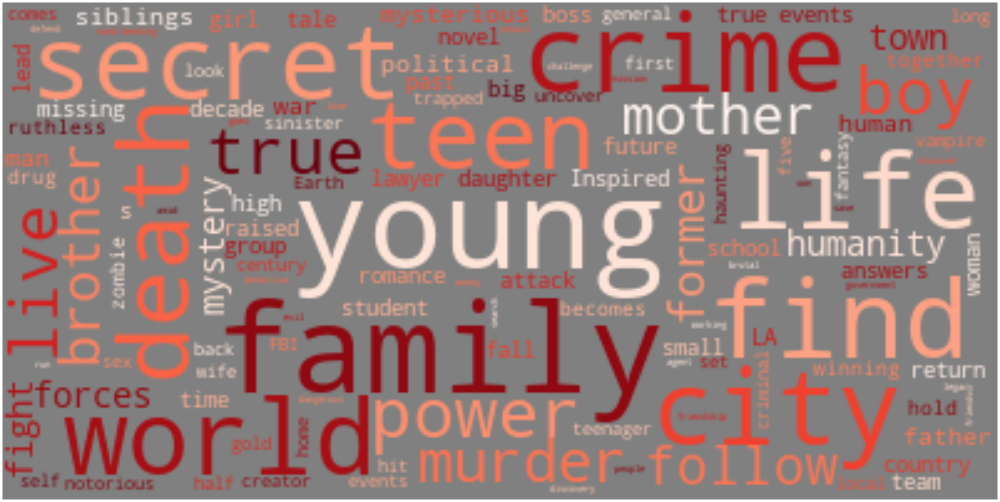

<module 'matplotlib.pyplot' from '/Users/s/opt/anaconda3/lib/python3.9/site-packages/matplotlib/pyplot.py'>

In [14]:
wordclouds(drama_p)

There are 105 words in the combination of all summary.


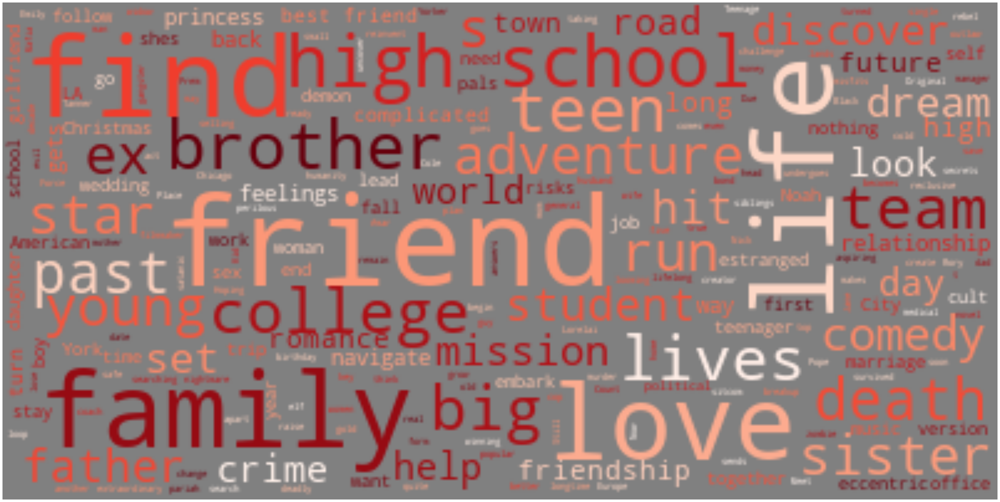

<module 'matplotlib.pyplot' from '/Users/s/opt/anaconda3/lib/python3.9/site-packages/matplotlib/pyplot.py'>

In [15]:
wordclouds(comedy_p)

There are 49 words in the combination of all summary.


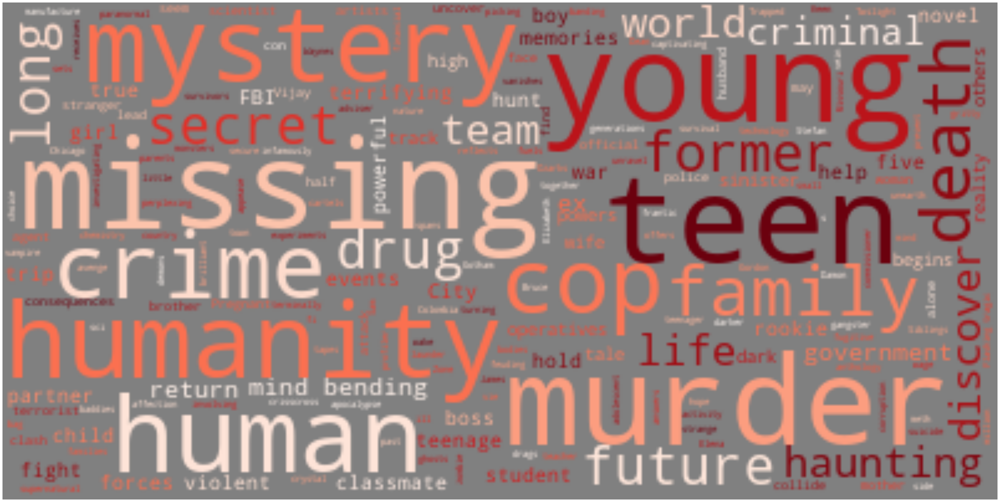

<module 'matplotlib.pyplot' from '/Users/s/opt/anaconda3/lib/python3.9/site-packages/matplotlib/pyplot.py'>

In [16]:
wordclouds(thriller_p)

There are 40 words in the combination of all summary.


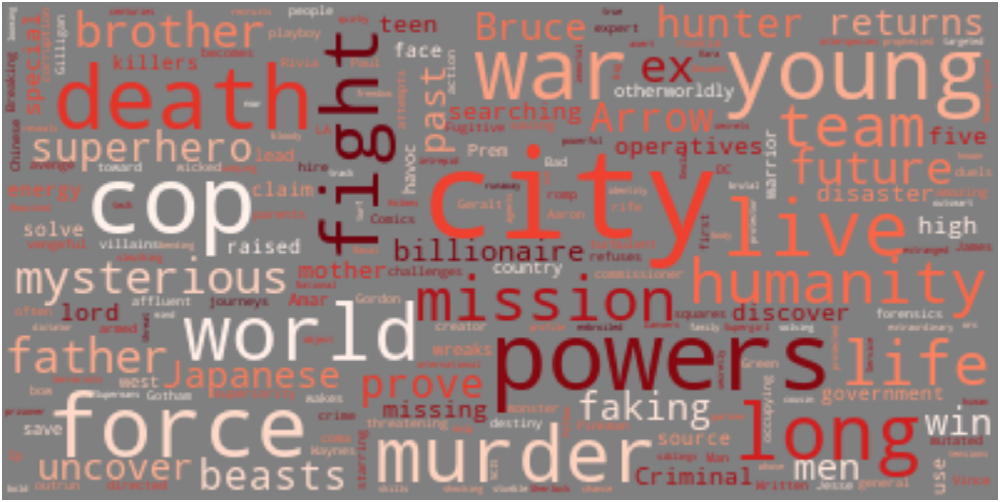

<module 'matplotlib.pyplot' from '/Users/s/opt/anaconda3/lib/python3.9/site-packages/matplotlib/pyplot.py'>

In [17]:
wordclouds(action_p)

There are 40 words in the combination of all summary.


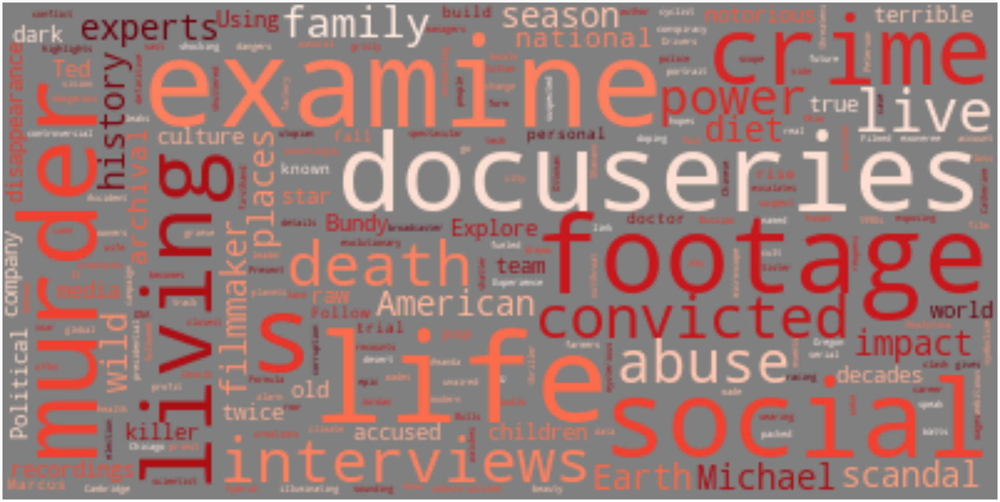

<module 'matplotlib.pyplot' from '/Users/s/opt/anaconda3/lib/python3.9/site-packages/matplotlib/pyplot.py'>

In [18]:
wordclouds(documentary_p)

There are 40 words in the combination of all summary.


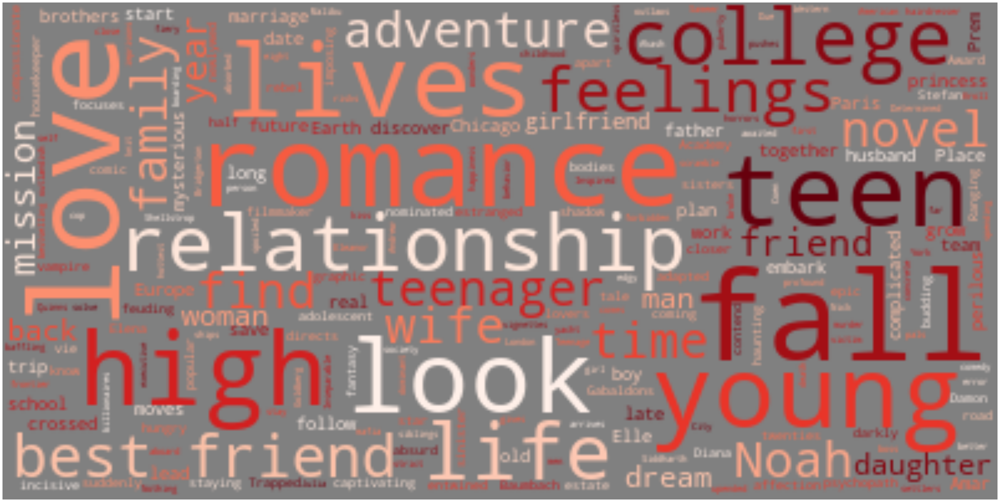

<module 'matplotlib.pyplot' from '/Users/s/opt/anaconda3/lib/python3.9/site-packages/matplotlib/pyplot.py'>

In [19]:
wordclouds(romance_p)

In [20]:
# build a function to choose keywords of highest frequency
def select(data): 
  # build dataframes of words of drama 
  word = pd.Series(' '.join(data
  ['Summary']).lower().split()).value_counts()
  word = word.to_frame().reset_index()
  word.columns = ['Word','Count']

  # create a list of stopwords
  stopwords = set(STOPWORDS)
  stopwords.update(["instead", "till", "tries", "A", "to" , "the", "and", "her", "his", "take" , "must", "takes", "till",\
                    "hes","one","two","three", "keep","good","four","become","years","make","fine", "new", "series", "drama",\
                    "based", "story", "documentary,", "documentary"])

  # delete stopwords for words of drama
  for n in stopwords:
    indexNames = word[word['Word'] == n].index
    word.drop(indexNames, inplace=True)

  word.drop(word[word['Word']=='--'].index, inplace=True)
  word = word.replace('events.','events')

  return word.iloc[0:10,:]


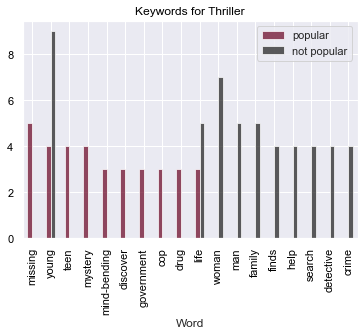

In [21]:
# plot bar chart for thriller
ax = pd.concat({
      'popular':select(thriller_p).set_index('Word').Count, 'not popular': select(thriller_np).set_index('Word').Count
  }, axis=1).plot.bar(cmap='RdGy', alpha = 0.7)

title_obj = plt.title("Keywords for Thriller")
plt.setp(title_obj, color='black') 
ax.tick_params(axis='x', colors='black')
ax.tick_params(axis='y', colors='black')
plt.show()

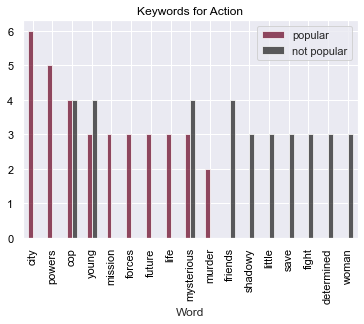

In [22]:
# plot bar chart for action
ax = pd.concat({
      'popular':select(action_p).set_index('Word').Count, 'not popular': select(action_np).set_index('Word').Count
  }, axis=1).plot.bar(cmap='RdGy', alpha = 0.7)

title_obj = plt.title("Keywords for Action")
plt.setp(title_obj, color='black') 
ax.tick_params(axis='x', colors='black')
ax.tick_params(axis='y', colors='black')
plt.show()


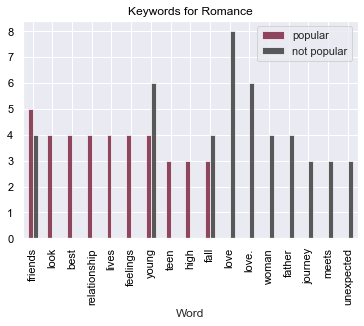

In [23]:
# plot bar chart for romance
ax = pd.concat({
      'popular':select(romance_p).set_index('Word').Count, 'not popular': select(romance_np).set_index('Word').Count
  }, axis=1).plot.bar(cmap='RdGy', alpha = 0.7)

title_obj = plt.title("Keywords for Romance")
plt.setp(title_obj, color='black') 
ax.tick_params(axis='x', colors='black')
ax.tick_params(axis='y', colors='black')
plt.show()

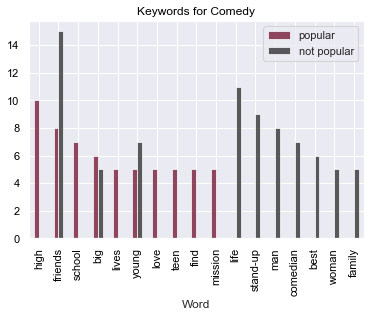

In [24]:
# plot bar chart for comedy
ax = pd.concat({
      'popular':select(comedy_p).set_index('Word').Count, 'not popular': select(comedy_np).set_index('Word').Count
  }, axis=1).plot.bar(cmap='RdGy', alpha = 0.7)

title_obj = plt.title("Keywords for Comedy")
plt.setp(title_obj, color='black') 
ax.tick_params(axis='x', colors='black')
ax.tick_params(axis='y', colors='black')
plt.show()

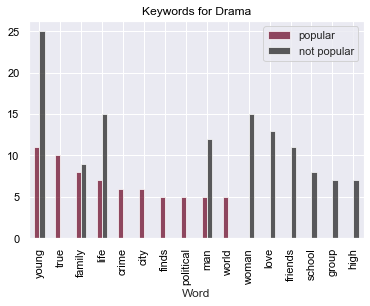

In [25]:
# plot bar chart for drama
ax = pd.concat({
      'popular':select(drama_p).set_index('Word').Count, 'not popular': select(drama_np).set_index('Word').Count
  }, axis=1).plot.bar(cmap='RdGy', alpha = 0.7)

title_obj = plt.title("Keywords for Drama")
plt.setp(title_obj, color='black') 
ax.tick_params(axis='x', colors='black')
ax.tick_params(axis='y', colors='black')
plt.show()

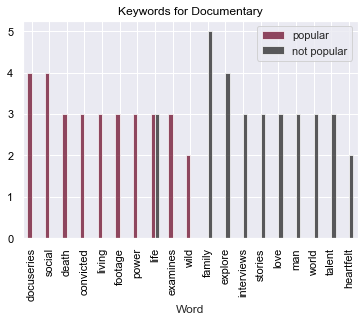

In [26]:
# plot bar chart for documentary
ax = pd.concat({
      'popular':select(documentary_p).set_index('Word').Count, 'not popular': select(documentary_np).set_index('Word').Count
  }, axis=1).plot.bar(cmap='RdGy', alpha = 0.7)

title_obj = plt.title("Keywords for Documentary")
plt.setp(title_obj, color='black') 
ax.tick_params(axis='x', colors='black')
ax.tick_params(axis='y', colors='black')
plt.show()

## Conclusion
Keyword selections for popular and unpopular content are different. For example, for the genre documentary, "docuseries" and "social" are the most frequently used keywords for popular content, while "family" is the most keywords for unpopular ones. 

To attract audiences, the company could choose more targeted keywords when writing summaries for their popular content.